# **SOC Prediction of "LG 18650HG2 Li-ion Battery Data"**
LG 18650HG2 Li-ion Battery Data - https://data.mendeley.com/datasets/cp3473x7xv/3

Kollmeyer, Philip; Vidal, Carlos; Naguib, Mina; Skells, Michael (2020), “LG 18650HG2 Li-ion Battery Data and Example Deep Neural Network xEV SOC Estimator Script”, Mendeley Data, V3, doi: 10.17632/cp3473x7xv.3

## Helper Functions

In [ ]:
import os
import pandas as pd
import numpy as np
import pandas as pd
import collections
from datetime import datetime, timedelta

def normalization(dataset, minmax_norm):
    # scale (normalize) the dataset
    # min max normalization
    if(minmax_norm):
        dataset_norm = (dataset - dataset.min())/(dataset.max() - dataset.min())
    # mean normalization
    else:
        dataset_norm = (dataset - dataset.mean())/dataset.std()

    return dataset_norm

def lg_get_files(data_path, drive_cycle_files, charge_cycle_files, temperature, get_discharge_only = True):

    # some LSTM training models require discharge cycles only
    if get_discharge_only:
        all_cycles = drive_cycle_files
    else:
        all_cycles = drive_cycle_files + charge_cycle_files

    # iterate thru each temperature folder and get drive cycle and corresponding charge files
    lg_csv_files = []
    folders = os.listdir(data_path)
    for folder in folders:
        d = os.path.join(data_path, folder)
        if os.path.isdir(d):
            for file in os.listdir(d):
                if file.endswith('.csv') and any(substring in file for substring in all_cycles):
                    lg_csv_files.append(data_path +'/'+ folder + '/' + file)

    # get the first valid index in each file and add it to the 'files' dictionary
    files = {}
    for csv_file in lg_csv_files:
        if any('/'+ substring in csv_file for substring in temperature):
            df = pd.read_csv(csv_file, header=[25,26], index_col=0, parse_dates=True,nrows=26)
            files[str(df.first_valid_index())] = csv_file

    # sort the dictionary by time index
    od = collections.OrderedDict(sorted(files.items()))
    filtered = od.copy()

    # the ordered dictionary can have unnecessary charge files, pop them out
    # incorrect sequence can have - charge, charge, discharge, charge
    # with this section the file sequence will look like - discharge, charge, discharge..
    if not get_discharge_only:

        is_previous_charge = False
        is_previous_discharge = False

        for key, value in od.items():
            if not is_previous_discharge and any(substring in value for substring in drive_cycle_files):
                is_previous_discharge = True
                is_previous_charge = False
            elif not is_previous_charge and any(substring in value for substring in charge_cycle_files):
                if not is_previous_charge and not is_previous_discharge:
                    filtered.pop(key)
                is_previous_charge = True
                is_previous_discharge = False
            elif is_previous_discharge and any(substring in value for substring in drive_cycle_files):
                filtered.pop(key)
            elif is_previous_charge and any(substring in value for substring in charge_cycle_files):
                filtered.pop(key)

    return list(filtered.values())

def lg_create_dataset(file_paths, drive_cycle_files, charge_cycle_files, vi_averages = True, resample_1hz = True, minmax_norm = True):

    for path in file_paths:
        cycle = pd.read_csv(path, header=[25,26], index_col=0, parse_dates=True)

        print(path + " " + str(cycle.shape[0]))

        #drop second row in the header
        cycle.columns = cycle.columns.droplevel(1)

        # calculate SOC Percentage + downsample discharge cycles, upsample charge cycles
        # - DISCHARGE FILES
        if any(substring in path for substring in drive_cycle_files):
            if resample_1hz:
                cycle = cycle.resample('1S').first()

            max_discharge = abs(min(cycle['Capacity']))
            cycle['Capacity'] = (cycle['Capacity'] + max_discharge)/max_discharge

        # - CHARGE FILES
        elif any(substring in path for substring in charge_cycle_files):
            if resample_1hz:
                cycle = cycle[~cycle.index.duplicated(keep='first')]
                cycle = cycle.resample('1S').ffill()

            max_charge = abs(max(cycle['Capacity']))
            cycle['Capacity'] = (cycle['Capacity'])/max_charge

        # leave out 'PAU' rows from the cycle
        options = ['CHA', 'DCH', 'TABLE']
        cycle = cycle[cycle['Status'].isin(options)]

        # calculate 'Power'
        cycle['Power'] = cycle['Voltage'] * cycle['Current']

        # select required features
        parameters = cycle[['Voltage', 'Current', 'Temperature', 'Power', 'Capacity']].copy()

        # calculate 'Voltage', 'Current' and 'Power' averages
        # 500 second rolling window which translates to rougly 500 data points for resampled data and 5000 for raw data
        rolling_window = 5000
        if vi_averages and resample_1hz:
            rolling_window = int(rolling_window / 10)

        if vi_averages:
            parameters['Voltage Average'] = parameters['Voltage'].rolling(rolling_window).mean()
            parameters['Current Average'] = parameters['Current'].rolling(rolling_window).mean()
            parameters['Power Average'] = parameters['Power'].rolling(rolling_window).mean()

        # drop rows with NaN or empty values in them, reset the index to reflect
        parameters.dropna(inplace=True)
        parameters.reset_index(drop=True, inplace=True)

        # merge datasets
        try:
            merged = pd.concat([merged, parameters], ignore_index=True)
        except:
            merged = parameters.copy()

    merged_norm = normalization(merged, minmax_norm)

    return merged, merged_norm


def app_create_dataset(path, vi_averages = True, resample_1hz = True, minmax_norm = True):

    cycle = pd.read_csv(path, index_col=0, parse_dates=True)

    if resample_1hz:
        cycle = cycle.resample('1S').first()

    # calculate 'Power'
    cycle['Power'] = cycle['Voltage'] * cycle['Current']

    if 'Capacity' in cycle:
        parameters = cycle[['Voltage', 'Current', 'Temperature', 'Power', 'Capacity']].copy()

    else:
        parameters = cycle[['Voltage', 'Current', 'Temperature', 'Power']].copy()

    # calculate 'Voltage', 'Current' and 'Power' averages
    # 500 second rolling window which translates to rougly 500 data points for resampled data and 5000 for raw data
    rolling_window = 5000
    if vi_averages and resample_1hz:
        rolling_window = int(rolling_window / 10)

    if vi_averages:
        parameters['Voltage Average'] = parameters['Voltage'].rolling(rolling_window).mean()
        parameters['Current Average'] = parameters['Current'].rolling(rolling_window).mean()
        parameters['Power Average'] = parameters['Power'].rolling(rolling_window).mean()

    # drop rows with NaN or empty values in them, reset the index to reflect
    parameters.dropna(inplace=True)
    parameters.reset_index(drop=True, inplace=True)

    parameters_norm = normalization(parameters, minmax_norm)

    return parameters, parameters_norm

# # create_lstm_dataset - https://github.com/KeiLongW/battery-state-estimation
# def create_lstm_dataset(dataset, steps):
#     dataset.drop(['Power', 'Power Average'], axis=1, inplace=True)
#     train_y = dataset.pop('Capacity').to_numpy()
#     train_y = train_y.reshape(len(train_y),1)
#     train_x = dataset.to_numpy()

#     x_length = len(train_x[0])
#     y_length = len(train_y[0])
#     x = np.empty((0, steps, x_length), float)
#     y = np.empty((0, steps, y_length), float)

#     number_subsequences = int(len(train_x)/steps)

#     for i in range(0, number_subsequences*steps, steps):
#         next_x = np.array(train_x[i:i + steps]).reshape(1, steps, x_length)
#         next_y = np.array(train_y[i:i + steps]).reshape(1, steps, y_length)
#         x = np.concatenate((x, next_x))
#         y = np.concatenate((y, next_y))

#     return x, y

# keep_only_y_end - https://github.com/KeiLongW/battery-state-estimation
def keep_only_y_end(y, step):
    return y[:,::step]

## Main Code Body

In [ ]:
import os
import sys
import IPython
import IPython.display
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import collections
from numpy import reshape, array
from datetime import datetime, timedelta

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

cell_type = "lg"
model_type = "cnn_model"


lg_data_path = '/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2'

resample_1hz = True
vi_averages = True

### LG Train, Test Pre-Processing

In [ ]:
lg_charge_cycles = ['Charge']

lg_train_temps = ['n10degC', '0degC', '10degC', '25degC']
lg_train_discharge_cycles = ['Mixed']

lg_test_temps = ['n10degC', '0degC', '10degC', '25degC']
lg_test_discharge_cycles = ['UDDS', 'HWFET', 'LA92', 'US06']

lg_train_files = lg_get_files(lg_data_path,
                                    lg_train_discharge_cycles,
                                    lg_charge_cycles,
                                    lg_train_temps)

lg_test_files = lg_get_files(lg_data_path,
                                   lg_test_discharge_cycles,
                                   lg_charge_cycles,
                                   lg_test_temps)

lg_train, lg_train_norm = lg_create_dataset(lg_train_files,
                                                  lg_train_discharge_cycles,
                                                  lg_charge_cycles,
                                                  vi_averages,
                                                  resample_1hz)

lg_test, lg_test_norm = lg_create_dataset(lg_test_files,
                                                lg_test_discharge_cycles,
                                                lg_charge_cycles,
                                                vi_averages,
                                                resample_1hz)

/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/551_Mixed1.csv 77227
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/551_Mixed2.csv 79172
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/552_Mixed3.csv 73827
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/552_Mixed4.csv 80850
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/552_Mixed5.csv 72184
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/552_Mixed6.csv 78106
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/552_Mixed7.csv 73235
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/552_Mixed8.csv 85915
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/10degC/567_Mixed1.csv 72329
/content/d

<ipython-input-1-554efcb57001>:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cycle['Power'] = cycle['Voltage'] * cycle['Current']


/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/n10degC/604_Mixed6.csv 55968
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/n10degC/604_Mixed7.csv 55940
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/n10degC/604_Mixed8.csv 67325
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/551_UDDS.csv 159646
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/551_HWFET.csv 6002
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/551_LA92.csv 100764
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/25degC/551_US06.csv 40155
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/10degC/567_US06.csv 38718
/content/drive/MyDrive/SOC_Estimation_Project/SOC_Estimation_Datasets/LG_18650HG2/10degC/576_UDDS.csv 148898
/content/drive/M

### LG Train, Test Stats

In [ ]:
lg_train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Time Stamp,,,,,,,,
Voltage,176334.0,3.665063,0.262172,2.792680,3.494900,3.672220,3.859490,4.200630
Current,176334.0,-1.333758,2.561152,-17.822440,-2.556640,-0.950120,-0.097060,5.999610
Temperature,176334.0,7.891981,12.526156,-9.884900,-0.315480,9.359110,23.976150,26.289630
Power,176334.0,-4.596105,8.941956,-50.862673,-9.210683,-3.477834,-0.386161,25.171220
Capacity,176334.0,0.485778,0.267832,0.000000,0.269070,0.473796,0.715691,0.978056
Voltage Average,176334.0,3.699654,0.226606,3.094354,3.521361,3.694212,3.889611,4.139058
Current Average,176334.0,-1.296481,0.711963,-3.715850,-1.720026,-1.162827,-0.772447,-0.277316
Power Average,176334.0,-4.522300,2.410210,-11.429077,-5.996818,-4.127167,-2.722423,-1.079428


In [ ]:
lg_test.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Time Stamp,,,,,,,,
Voltage,104485.0,3.677951,0.261341,2.794030,3.496920,3.689080,3.885750,4.200120
Current,104485.0,-1.098654,2.357463,-17.610450,-2.191410,-0.625750,-0.084280,5.999610
Temperature,104485.0,6.921388,12.063139,-10.095220,-0.420630,9.148790,23.765830,26.815430
Power,104485.0,-3.776420,8.243404,-50.864924,-7.916661,-2.317480,-0.316026,25.142453
Capacity,104485.0,0.484375,0.267702,0.000000,0.258278,0.494788,0.714165,0.955909
Voltage Average,104485.0,3.704737,0.229296,3.049658,3.523629,3.716103,3.900654,4.110299
Current Average,104485.0,-1.097331,0.728330,-3.810095,-1.335683,-0.867386,-0.523847,-0.311306
Power Average,104485.0,-3.824287,2.439860,-11.887300,-4.544482,-3.073238,-1.888219,-1.210706


### LG Dataset Figures & Distribution

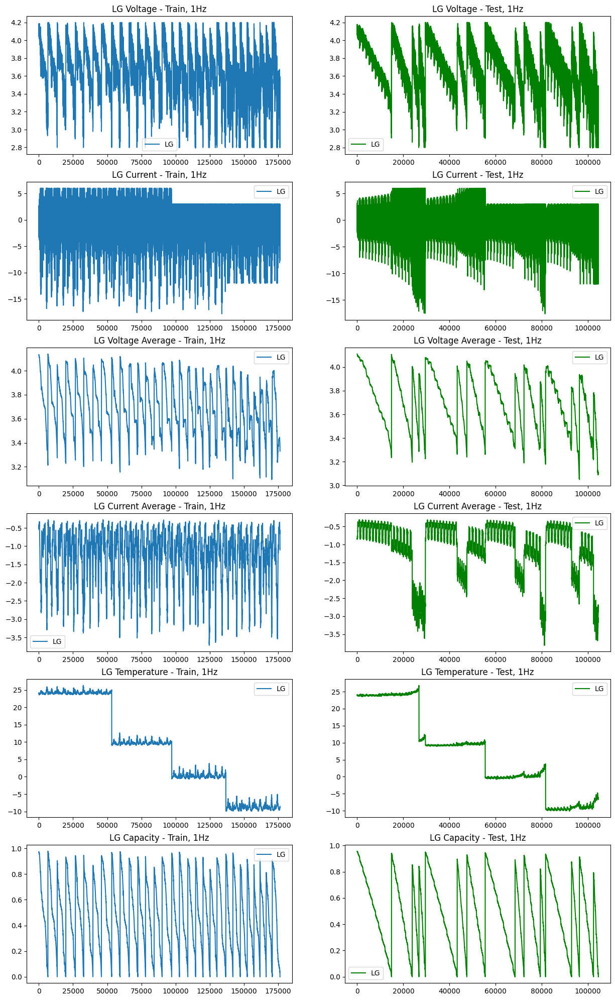

In [ ]:
plot_cols = ['Voltage', 'Current', 'Voltage Average', 'Current Average', 'Temperature', 'Capacity']

fig, axs = plt.subplots(nrows=len(plot_cols), ncols=2, figsize=(15, 25))

for i, col in enumerate(plot_cols):
    axs[i, 0].plot(lg_train[col], label='LG')
    axs[i, 0].set_title(f'LG {col} - Train, 1Hz')
    axs[i, 0].legend()

    axs[i, 1].plot(lg_test[col], label='LG', color="green")
    axs[i, 1].set_title(f'LG {col} - Test, 1Hz')
    axs[i, 1].legend()

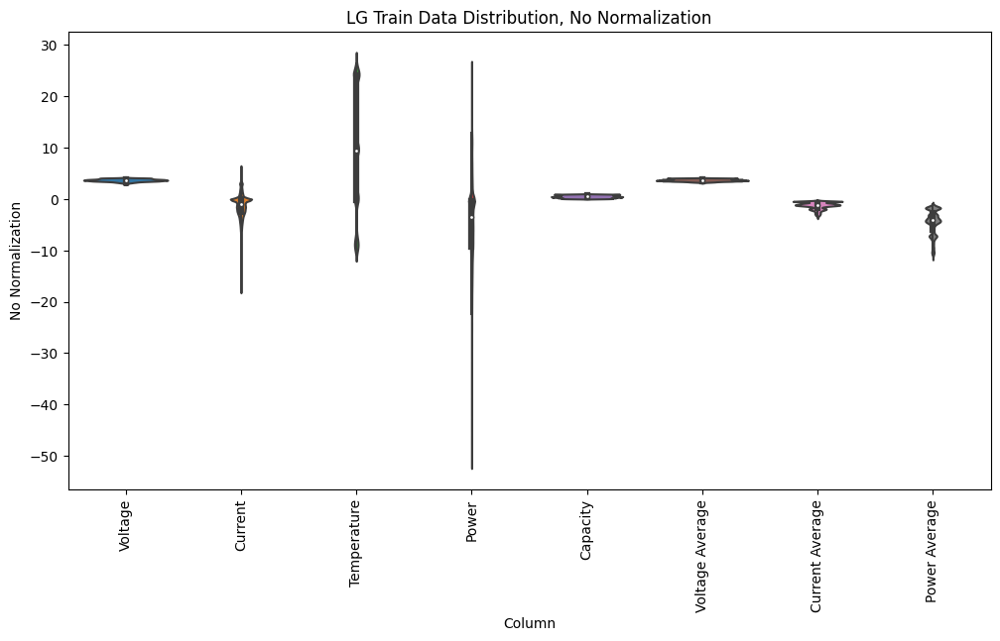

In [ ]:
df_std = lg_train.melt(var_name='Column', value_name='No Normalization')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='No Normalization', data=df_std)
_ = ax.set_xticklabels(lg_train.keys(), rotation=90)
_ = ax.set_title(label='LG Train Data Distribution, No Normalization')

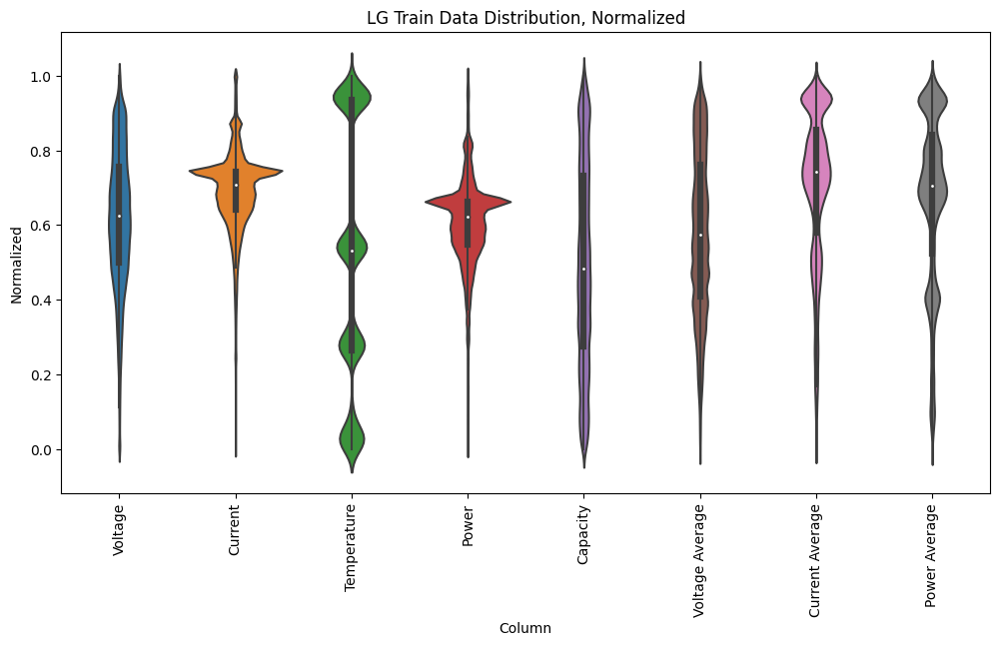

In [ ]:
df_std = lg_train_norm.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(lg_train_norm.keys(), rotation=90)
_ = ax.set_title(label='LG Train Data Distribution, Normalized')

Text(0.5, 1.01, 'Pair Plot, LG Training Dataset')

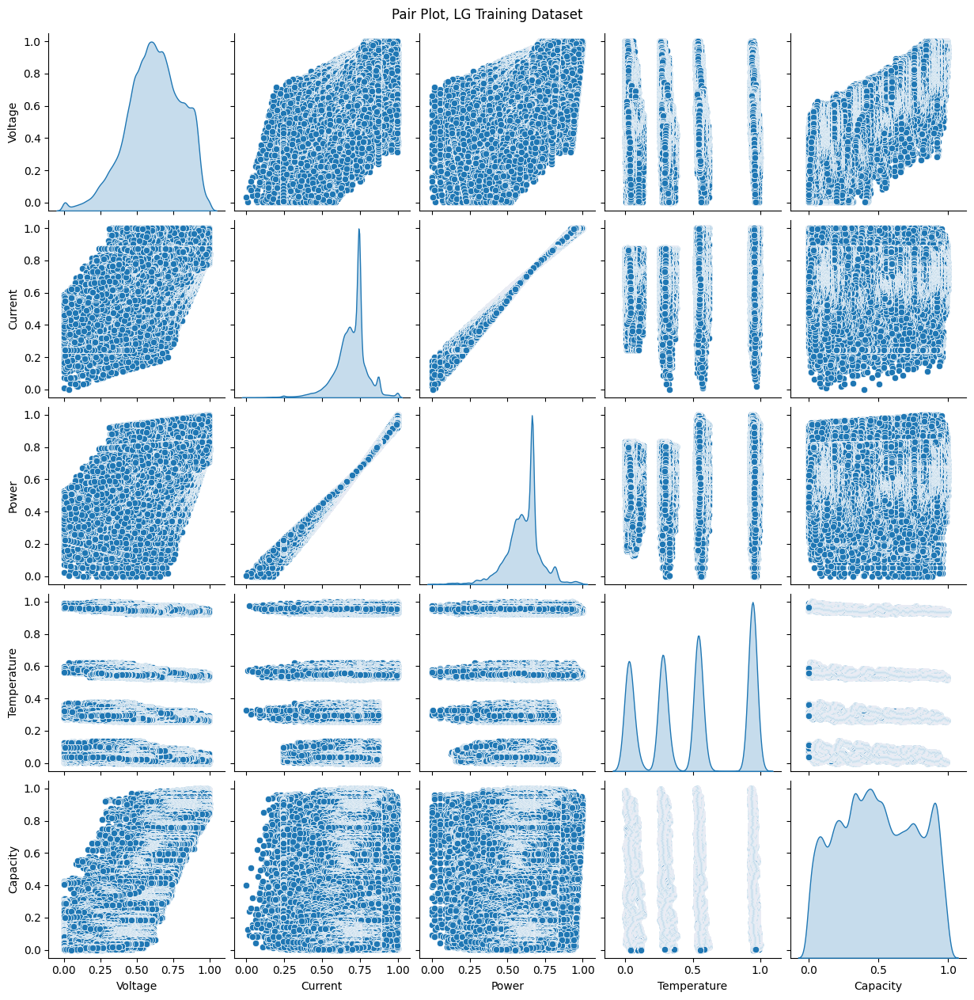

In [ ]:
ax = sns.pairplot(lg_train_norm[['Voltage', 'Current', 'Power', 'Temperature', 'Capacity']], diag_kind='kde')
ax.fig.suptitle("Pair Plot, LG Training Dataset", y = 1.01)

### Dataset Preparation

In [ ]:
train_features = lg_train_norm
test_features = lg_test_norm

train_labels = train_features.pop('Capacity')
test_labels = test_features.pop('Capacity')

In [ ]:
# reshape for CNN 1-D
train_array = array(train_features)
labels_array = array(train_labels)

sample_size = train_features.shape[0]
time_steps = train_features.shape[1]
input_dimension = 1

train_reshaped = train_array.reshape((sample_size,time_steps,1))
labels_reshaped = labels_array.reshape((train_labels.shape[0],1,1))

print(train_reshaped.shape)
print(labels_reshaped.shape)

(176334, 7, 1)
(176334, 1, 1)


## Training With Original CNN Model

In [ ]:
# cnn model definition
cnn_model = Sequential()
cnn_model.add(Conv1D(filters=32,
                     kernel_size=(train_features.shape[1],),
                     activation='relu'))
cnn_model.add(Dense(32, activation='relu'))
cnn_model.add(Dense(1))

cnn_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mean_absolute_error')

In [ ]:
%%time
history = cnn_model.fit(
    train_reshaped,
    train_labels,
    epochs=25, batch_size=32,
    verbose=1, validation_split=0.2)

Epoch 1/25
4409/4409 [==============================] - 35s 6ms/step - loss: 0.0186 - val_loss: 0.0272
Epoch 2/25
4409/4409 [==============================] - 23s 5ms/step - loss: 0.0108 - val_loss: 0.0201
Epoch 3/25
4409/4409 [==============================] - 20s 4ms/step - loss: 0.0101 - val_loss: 0.0226
Epoch 4/25
4409/4409 [==============================] - 22s 5ms/step - loss: 0.0095 - val_loss: 0.0263
Epoch 5/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0092 - val_loss: 0.0204
Epoch 6/25
4409/4409 [==============================] - 22s 5ms/step - loss: 0.0090 - val_loss: 0.0206
Epoch 7/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0089 - val_loss: 0.0265
Epoch 8/25
4409/4409 [==============================] - 20s 5ms/step - loss: 0.0087 - val_loss: 0.0198
Epoch 9/25
4409/4409 [==============================] - 21s 5ms/step - loss: 0.0087 - val_loss: 0.0218
Epoch 10/25
4409/4409 [==============================] - 19s 4ms/step - l

### Save Model & Evaluate

In [ ]:
cnn_model.save('/content/drive/MyDrive/SOC_Estimation_Project/Saved_Models')

# load pre-trained model
# model = tf.keras.models.load_model(pre_trained_path)

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
20,0.007943,0.018738,20
21,0.007873,0.023122,21
22,0.007849,0.019401,22
23,0.007852,0.020140,23
24,0.007833,0.020538,24


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_0, *['loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_1, *['val_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_2, *['epoch'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_3, *['loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_4, *['val_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_5, *['epoch'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_6, *[[['loss', 'val_loss'], ['val_loss', 'epoch']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_7, *['epoch', 'loss', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_8, *['epoch', 'val_loss', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_9, *['epoch', 'count()', None], **{})
chart

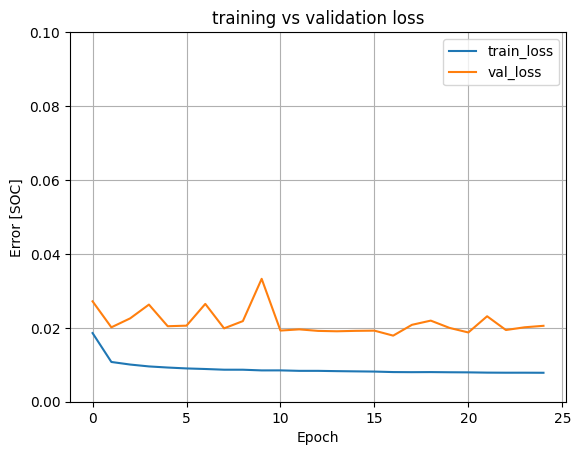

In [ ]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 0.1])
    plt.xlabel('Epoch')
    plt.ylabel('Error [SOC]')
    plt.title('training vs validation loss')
    plt.legend()
    plt.grid(True)

plot_loss(history)

3266/3266 - 8s - loss: 0.0236 - 8s/epoch - 3ms/step
3266/3266 [==============================] - 8s 2ms/step


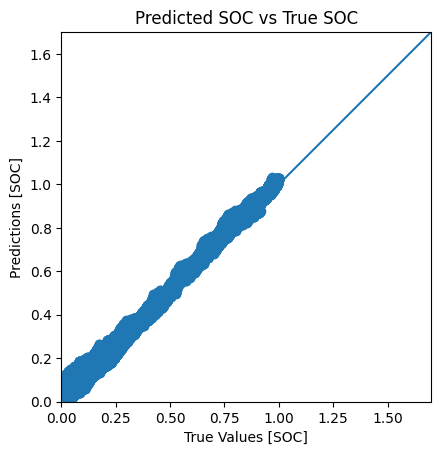

In [ ]:
test_results = cnn_model.evaluate(test_features, test_labels, verbose=2)
test_predictions = cnn_model.predict(test_features).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [SOC]')
plt.ylabel('Predictions [SOC]')
lims = [0, 1.7]
plt.xlim(lims)
plt.ylim(lims)
plt.title('Predicted SOC vs True SOC')
_ = plt.plot(lims, lims)

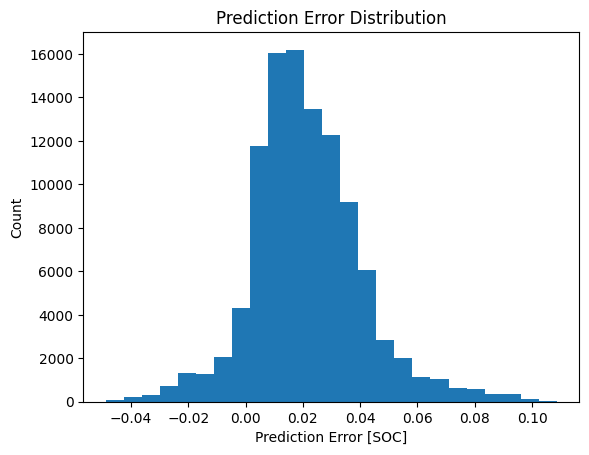

In [ ]:
error = test_predictions - test_labels
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [SOC]')
plt.title('Prediction Error Distribution')
_ = plt.ylabel('Count')

In [ ]:
import plotly.graph_objects as go

cycle_num = 0
steps_num = 100000
step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

fig = go.Figure()
fig.add_trace(go.Scatter(x=step_index, y=test_predictions[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SOC Predicted'))
fig.add_trace(go.Scatter(x=step_index, y=test_labels[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SOC Actual'))
fig.add_trace(go.Scatter(x=step_index, y=lg_test_norm['Temperature'][cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='Temperature'))
fig.update_layout(title='Result on Test Dataset',
                  xaxis_title='Step',
                  yaxis_title='SOC Percentage')
fig.show()

## Training With Improved CNN Model

In [ ]:
# cnn model definition

# create a sequential model
cnn_model = Sequential()

# add convolutional layers
cnn_model.add(Conv1D(filters=32,
                     kernel_size=2,
                     activation='relu'))
cnn_model.add(MaxPooling1D(pool_size=2))
cnn_model.add(Conv1D(filters=64,
                     kernel_size=2,
                     activation='relu'))
cnn_model.add(MaxPooling1D(pool_size=2))

# flatten the output
cnn_model.add(Flatten())

# add dense layers
cnn_model.add(Dense(64, activation='relu'))
cnn_model.add(Dense(32, activation='relu'))
cnn_model.add(Dense(1, activation='linear'))

cnn_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mean_absolute_error')

In [ ]:
%%time
history = cnn_model.fit(
    train_reshaped,
    train_labels,
    epochs=25, batch_size=32,
    verbose=1, validation_split=0.2)

Epoch 1/25
4409/4409 [==============================] - 34s 4ms/step - loss: 0.0319 - val_loss: 0.0330
Epoch 2/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0151 - val_loss: 0.0430
Epoch 3/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0131 - val_loss: 0.0256
Epoch 4/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0121 - val_loss: 0.0322
Epoch 5/25
4409/4409 [==============================] - 18s 4ms/step - loss: 0.0111 - val_loss: 0.0240
Epoch 6/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0104 - val_loss: 0.0214
Epoch 7/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0099 - val_loss: 0.0226
Epoch 8/25
4409/4409 [==============================] - 19s 4ms/step - loss: 0.0097 - val_loss: 0.0203
Epoch 9/25
4409/4409 [==============================] - 20s 4ms/step - loss: 0.0094 - val_loss: 0.0214
Epoch 10/25
4409/4409 [==============================] - 19s 4ms/step - l

### Save Model & Evaluate

In [ ]:
cnn_model.save('/content/drive/MyDrive/SOC_Estimation_Project/Saved_Models/Improved_model_2')

# load pre-trained model
# model = tf.keras.models.load_model(pre_trained_path)

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
20,0.007900,0.024254,20
21,0.007834,0.027246,21
22,0.007805,0.028084,22
23,0.007768,0.028119,23
24,0.007700,0.023980,24


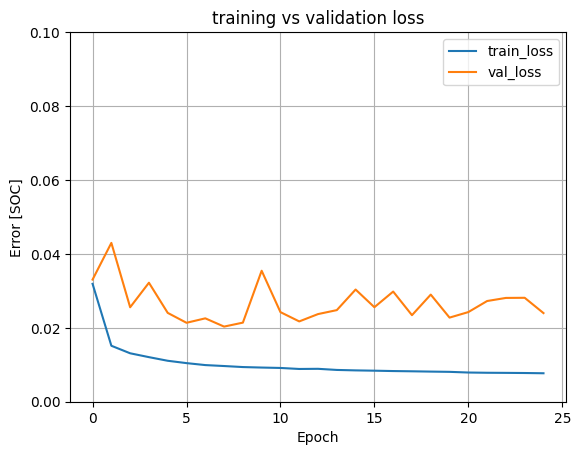

In [ ]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 0.1])
    plt.xlabel('Epoch')
    plt.ylabel('Error [SOC]')
    plt.title('training vs validation loss')
    plt.legend()
    plt.grid(True)

plot_loss(history)

3266/3266 - 6s - loss: 0.0232 - 6s/epoch - 2ms/step
3266/3266 [==============================] - 6s 2ms/step


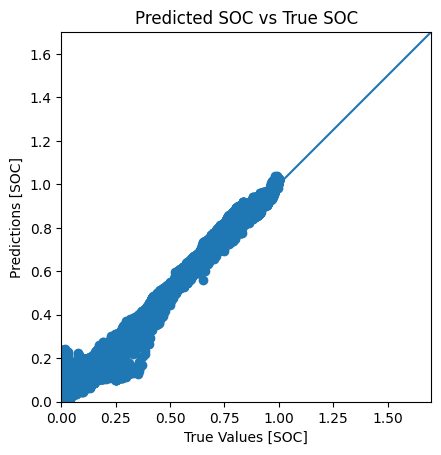

In [ ]:
test_results = cnn_model.evaluate(test_features, test_labels, verbose=2)
test_predictions = cnn_model.predict(test_features).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [SOC]')
plt.ylabel('Predictions [SOC]')
lims = [0, 1.7]
plt.xlim(lims)
plt.ylim(lims)
plt.title('Predicted SOC vs True SOC')
_ = plt.plot(lims, lims)

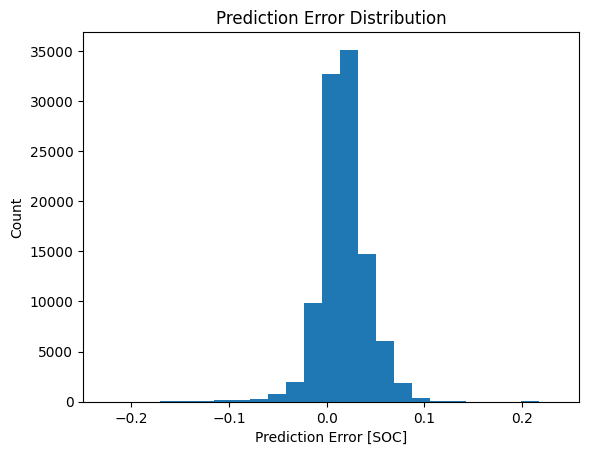

In [ ]:
error = test_predictions - test_labels
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [SOC]')
plt.title('Prediction Error Distribution')
_ = plt.ylabel('Count')

In [ ]:
import plotly.graph_objects as go

cycle_num = 0
steps_num = 100000
step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

fig = go.Figure()
fig.add_trace(go.Scatter(x=step_index, y=test_predictions[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SOC Predicted'))
fig.add_trace(go.Scatter(x=step_index, y=test_labels[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SOC Actual'))
fig.add_trace(go.Scatter(x=step_index, y=lg_test_norm['Temperature'][cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='Temperature'))
fig.update_layout(title='Result on Test Dataset',
                  xaxis_title='Step',
                  yaxis_title='SOC Percentage')
fig.show()